# Embedding Plots and Visualisations

Jede nutzbare Analyse und Visualisierungen sind hier gesammelt. 


In [1]:
from importlib import reload

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import save_load_models as save_load
import helper_methods as hmethods
import vector_search as vs
import visual_and_cluster as vis_cl

/home/abecker/.conda/envs/BachelorEnv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
multiMini = './Models/multilingual-MiniLM'
msMarcoMini = './Models/msmarco-MiniLM'
wikimedicalBioBert = './Models/wikimedical-BioBERT'
sPubMedBert = './Models/SPubMedBERT'

sPubMedBertFinetunedv1 = './Models/Finetunedv1/SPubMedBERT/end_model'
sPubMedBertFinetunedv2 = './Models/Finetunedv2/SPubMedBERT/end_model'
sPubMedBertFinetunedNfcorpus = './Models/Finetuned/SPubMedBERT-v1-nfcorpus'

model = save_load.load_model_sentencetransformer(multiMini)

In [55]:
'''
MultiMini
MsMarcoMini
WikiMedicalBERT
SPubMedBERT

SPubMedBERTFinetunedv1
SPubMedBERTFinetunedv2
SPubMedBERTFinetunedNfcorpus
'''
model_name = "SPubMedBERTFinetunedNfcorpus"

In [35]:
multiMiniDir = './Embeddings/multilingual-MiniLM/'
msMarcoMiniDir = './Embeddings/msmarco-MiniLM/'
wikimedicalBioBertDir = './Embeddings/wikimedical-BioBERT/'
sPubMedBertDir = './Embeddings/SPubMedBERT/'

sPubMedBertFinetunedv1Dir = './Embeddings/Finetunedv1/SPubMedBERT/'
sPubMedBertFinetunedv2Dir = './Embeddings/Finetunedv2/SPubMedBERT/'
sPubMedBertFinetunedNfcorpusDir = './Embeddings/FinetunedNfCorpus/SPubMedBERT/'

### Load Embeddings

In [56]:
reload(vs)
# Test_Data_Subset
embeddingDir = sPubMedBertFinetunedNfcorpusDir + 'Test_Data_Subset'

embeddings, refList = vs.add_embeddings_to_nparray_from_dir(embeddingDir)

### Query Embeddings

In [6]:
queryList = ["emergency treatment of sepsis", "choosing the point of care for acute health problems", 
              "covid and kidney disease", "How does delir impact the onset of dementia", 
              "NLP pipeline for medical publications", "chronic kidney disease", 
              "Natural Alzheimer's Treatment", "Covid long term effects",
             "How does delir impact the onset of alzheimer"]

queryRef, querySimilarity, queryEmbeddings = vs.query_articles(queryList, embeddings, np.reshape(refList, (-1, 1)), model, n=80, print_results=False)

query_types = {'Title':0,'Abstract':0}
for ref in np.array(queryRef).flatten():
    query_types[ref.split('-')[0]] +=1
print(query_types)

query_idx = 6
#print("Show Articles for Query: ", queryList[query_idx])
#articles = vs.get_articles(queryRef[query_idx], dir_path=embeddingDir)

{'Title': 470, 'Abstract': 250}


## Abstract-Title Similarity
Use only when there are only 2 Embeddings calculated.

In [7]:
from sklearn.metrics.pairwise import cosine_similarity
sample_embeddings = embeddings[:2000]
sim=[]
for i in range(0, sample_embeddings.shape[0], 2):
    sim.append(cosine_similarity([sample_embeddings[i]], [sample_embeddings[i+1]]))
sim_mean = np.mean(sim)
all_similarity = vs.calc_all_embedding_similarity(sample_embeddings, scaled=False)
avg_sim = np.mean(all_similarity)

lines = [
    f"Numbers for Model: {model_name}",
    (u"\u2500" * 35),
    f"Article-Title Mean: {sim_mean:.5f}",
    f"Average Similarity: {avg_sim:.5f}",
    f"Scaled Article-Title Mean: {sim_mean/avg_sim:.5f}"
]

# Open a file in write mode
with open(f'Plots/ViolinPlots/Numbers{model_name}.txt', 'w') as file:
    for line in lines: 
        file.write(line + '\n')
        print(line)

Numbers for Model: SPubMedBERTFinetunedNfcorpus
───────────────────────────────────
Article-Title Mean: 0.86250
Average Similarity: 0.52719
Scaled Article-Title Mean: 1.63602


### Plot the similarities

Plot Violin Plots of the Title-Abstract Similarities, the similarity between all points

#### Unscaled Similarity

Just raw version of the similarities.

[]

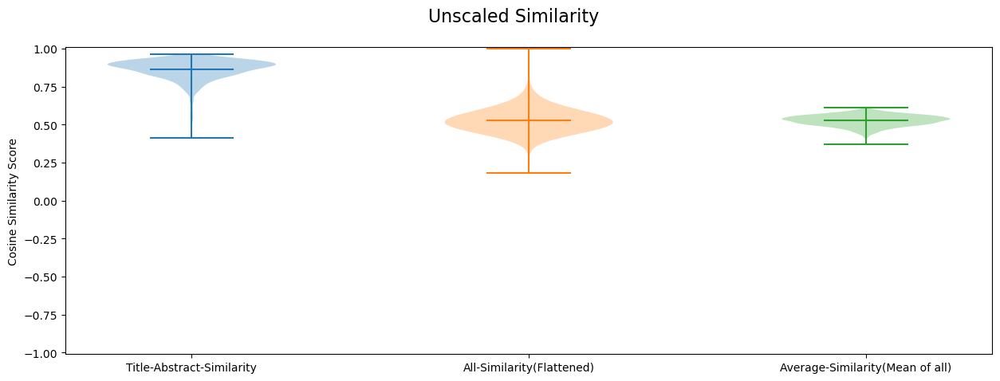

In [8]:
sim = np.squeeze(sim)
all_similarity_flattened = np.array(all_similarity).flatten()
all_similarity_mean = np.mean(all_similarity, axis=0)

fig = plt.figure(figsize=(15, 5))
fig.suptitle('Unscaled Similarity', fontsize=16)
plt.ylabel('Cosine Similarity Score', fontsize=10)

plt.violinplot(sim, positions=[1], showmeans=True, showextrema= True)
plt.violinplot(all_similarity_flattened, positions=[2], showmeans=True, showextrema= True)
plt.violinplot(all_similarity_mean, positions=[3], showmeans=True, showextrema= True)
#plt.axhline(y=avg_sim, color='r', linestyle='dashed')
plt.ylim(ymin=-1.01, ymax=1.01)
plt.xticks([1,2,3],labels=['Title-Abstract-Similarity','All-Similarity(Flattened)', 'Average-Similarity(Mean of all)'])

plt.savefig(f'Plots/ViolinPlots/Unscaled{model_name}.png')
plt.plot()

In [9]:
x = min(all_similarity_flattened)
y = max(all_similarity_flattened)
x_c = np.where(all_similarity_flattened==x)[0][0]
y_c = np.where(all_similarity_flattened==y)[0][0]
print("x: %f :"%x, x_c%2000, x_c//2000)
print("y: %f :"%y, y_c%2000, y_c//2000)

x: 0.184447 : 1050 786
y: 1.000000 : 1639 1639


#### Scaled Similarity

Scaled the similarity to be between 0 and 1. Makes for a different comparison.

[]

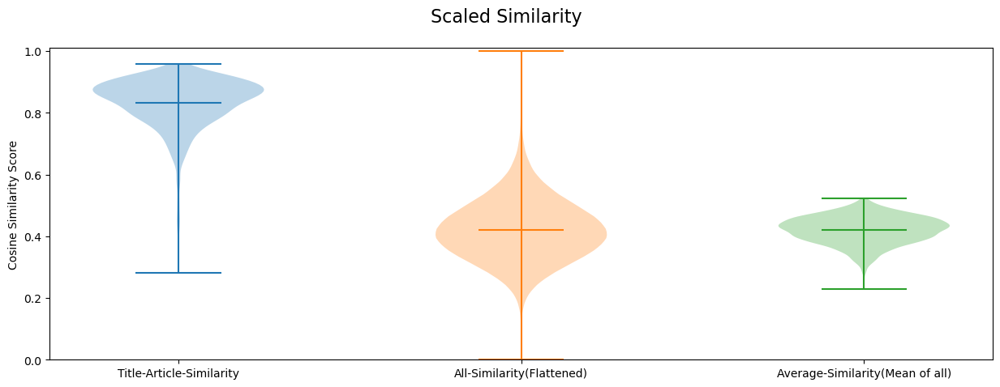

In [10]:
min_sim = np.min(all_similarity_flattened)
max_sim = np.max(all_similarity_flattened)

all_similarity_flattened_scaled = ((all_similarity_flattened - min_sim) / (max_sim - min_sim))
all_similarity_mean_scaled = ((all_similarity_mean - min_sim) / (max_sim - min_sim))
sim_scaled = ((sim - min_sim) / (max_sim - min_sim))

fig = plt.figure(figsize=(15, 5))
fig.suptitle('Scaled Similarity', fontsize=16)
plt.ylabel('Cosine Similarity Score', fontsize=10)

plt.violinplot(sim_scaled, positions=[1], showmeans=True, showextrema= True)
plt.violinplot(all_similarity_flattened_scaled, positions=[2], showmeans=True, showextrema= True)
plt.violinplot(all_similarity_mean_scaled, positions=[3], showmeans=True, showextrema= True)
#plt.axhline(y=avg_sim, color='r', linestyle='dashed')
plt.ylim(ymin=0, ymax=1.01)
plt.xticks([1,2,3],labels=['Title-Article-Similarity','All-Similarity(Flattened)', 'Average-Similarity(Mean of all)'])

plt.savefig(f'Plots/ViolinPlots/Scaled{model_name}.png')
plt.plot()

## Visualisation

### Color Map

In [11]:
cmap = plt.get_cmap('tab20')
my_cmap = cmap(np.arange(cmap.N))
alpha = np.full((cmap.N,), 0.8)
alpha[0] = 0.05
my_cmap[:,-1] = alpha
my_cmap = ListedColormap(my_cmap)

# ['pca', 'pca_tsne', 'agglo_tsne']

### Show 2d

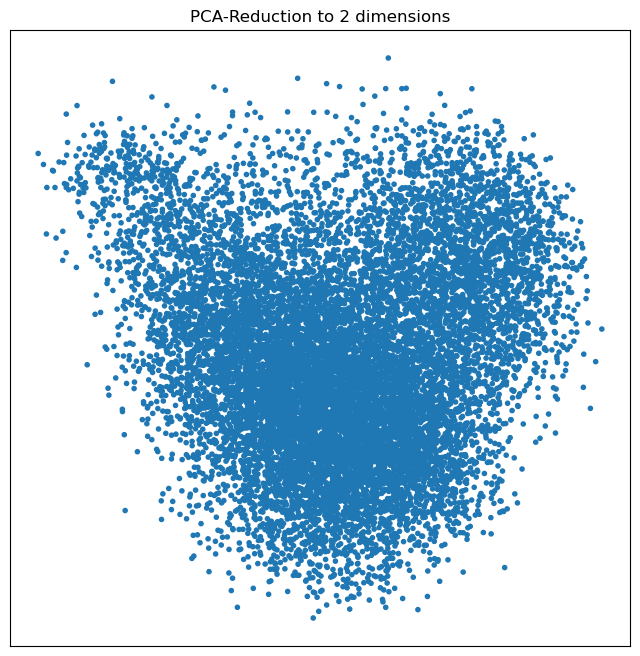

In [12]:
reload(vis_cl)

redCalc =vis_cl.plot_reduce_dimensions(embeddings, methods=['pca'])

### Show Embedding Types

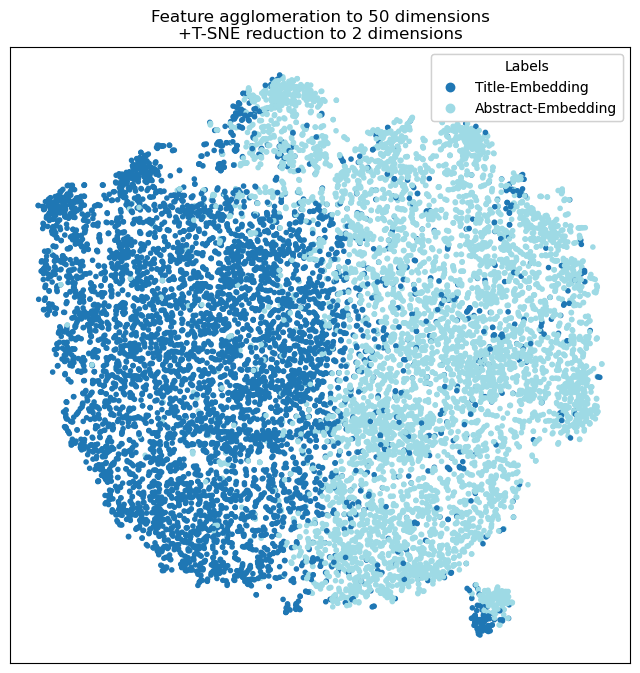

In [57]:
reload(vis_cl)
# agglo_tsne
# pca_tsne
method_type = 'agglo_tsne'

ref_list = refList.squeeze()
labels = [0] * len(ref_list)
embedd_cp = embeddings
#embedd_cp = np.delete(embeddings, 424, axis=1)

labels = [a.split("-")[0] for a in ref_list]
labels = [0 if l == 'Title' else 1 if l =='Abstract' else 2 for l in labels]

redCalc = vis_cl.plot_reduce_dimensions(embedd_cp, methods=[method_type], labels=labels, model_name=model_name)

### Plotly show metadata coloring

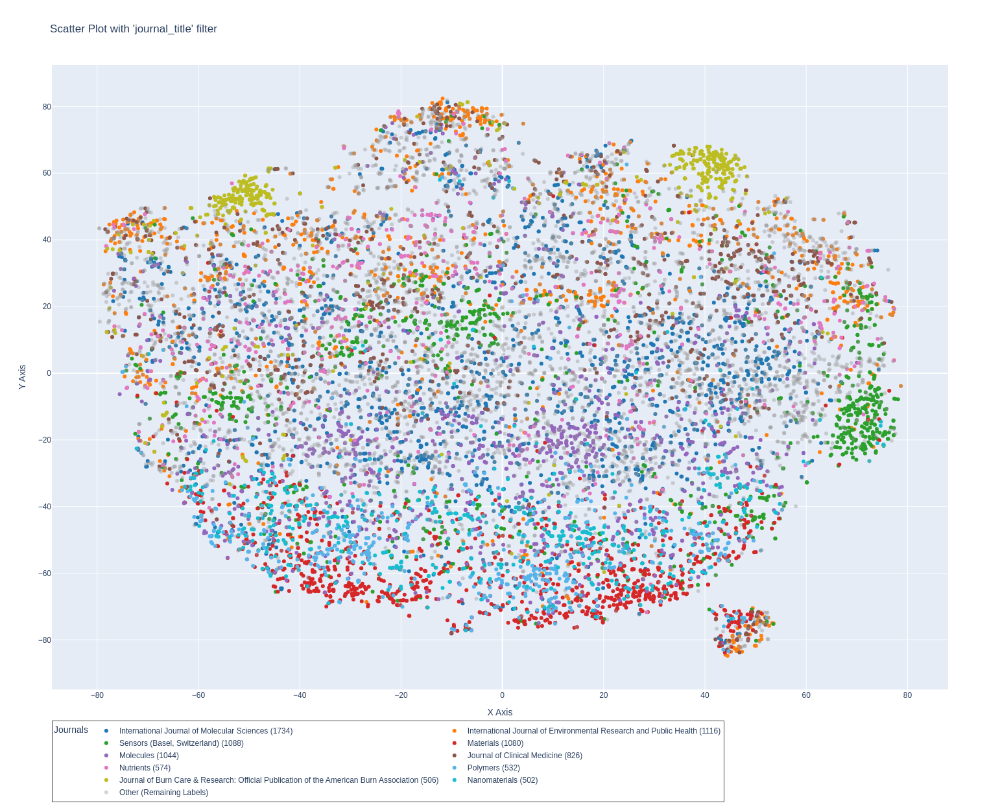

In [58]:
import plotly.graph_objects as go
from collections import Counter

# Sample data
id_list = [a.split("-")[1] for a in ref_list]
label_dict = vis_cl.label_from_metadata(list(set(id_list)), embeddingDir, "journal_title")
label_vals = [label_dict[id_val] for id_val in id_list]
coordinates = redCalc[0]

# Count occurrences of each label
label_counts = Counter(label_vals)

# Get the top 10 labels
top_labels = [label for label, _ in label_counts.most_common(10)]

# Define fixed colours for the top 10
fixed_colors = [
    "rgb(31, 119, 180)",  # Blue
    "rgb(255, 127, 14)",  # Orange
    "rgb(44, 160, 44)",   # Green
    "rgb(214, 39, 40)",   # Red
    "rgb(148, 103, 189)", # Purple
    "rgb(140, 86, 75)",   # Brown
    "rgb(227, 119, 194)", # Pink
    "rgb(86, 180, 233)",  # Light Grey
    "rgb(188, 189, 34)",  # Olive
    "rgb(23, 190, 207)"   # Teal
]

# Assign each top label a fixed color
color_map = {label: fixed_colors[i] for i, label in enumerate(top_labels)}
default_color = "rgb(150, 150, 150)"

# Create traces for the top 10 labels
traces = []
for label in top_labels:
    indices = [i for i, l in enumerate(label_vals) if l == label]
    traces.append(go.Scatter(
        x=[coordinates[i][0] for i in indices],
        y=[coordinates[i][1] for i in indices],
        mode='markers',
        name=f"{label} ({label_counts[label]})",
        text=[f"{label} ({label_counts[label]})"] * len(indices),
        hoverinfo='text',
        marker=dict(color=color_map[label], opacity=1),
        showlegend=True
    ))

# Combine non top 10 into one label with less opacity
other_indices = [i for i, l in enumerate(label_vals) if l not in top_labels]
if other_indices:  
    traces.append(go.Scatter(
        x=[coordinates[i][0] for i in other_indices],
        y=[coordinates[i][1] for i in other_indices],
        mode='markers',
        name="Other (Remaining Labels)",
        text=["Other (Remaining Labels)"] * len(other_indices),
        hoverinfo='text',
        marker=dict(color="rgb(150, 150, 150)", opacity=0.4),
        showlegend=True
    ))

# Create the figure
fig = go.Figure(data=traces)

# Keep the plot square and adjust legend closer
fig.update_layout(
    title="Scatter Plot with 'journal_title' filter",
    xaxis_title="X Axis",
    yaxis_title="Y Axis",
    legend_title="Journals",
    height=1250,
    width=1250,  
    legend=dict(
        orientation="h",
        y=-0.05,
        xanchor="left", yanchor="top",
        traceorder="normal",
        borderwidth=1
    )
)

# Save the plot
fig.write_image(f'Plots/JournalColouring/{method_type}_{model_name}.png')

fig.show()

### Show Search Results

## Embedding Space Analysis

### Mean and Std

Furthest means (Idx, Val):  [(601, 1.0531688605299583), (697, 1.2016272010135598), (502, 1.2609569016386761), (424, -6.391937976307276), (726, -1.3440186718043594)]
Lowest Std (Idx, Val):  [(574, 0.2836832970801867), (400, 0.28013133697038267), (229, 0.2717290332170268), (593, 0.2828981658746562), (320, 0.2840880129660283)]
Highest Std (Idx, Val):  [(202, 0.5549514960862848), (160, 0.5800706667825698), (502, 0.7122414245548733), (334, 0.5865882113271623), (424, 0.7074267167216578)]


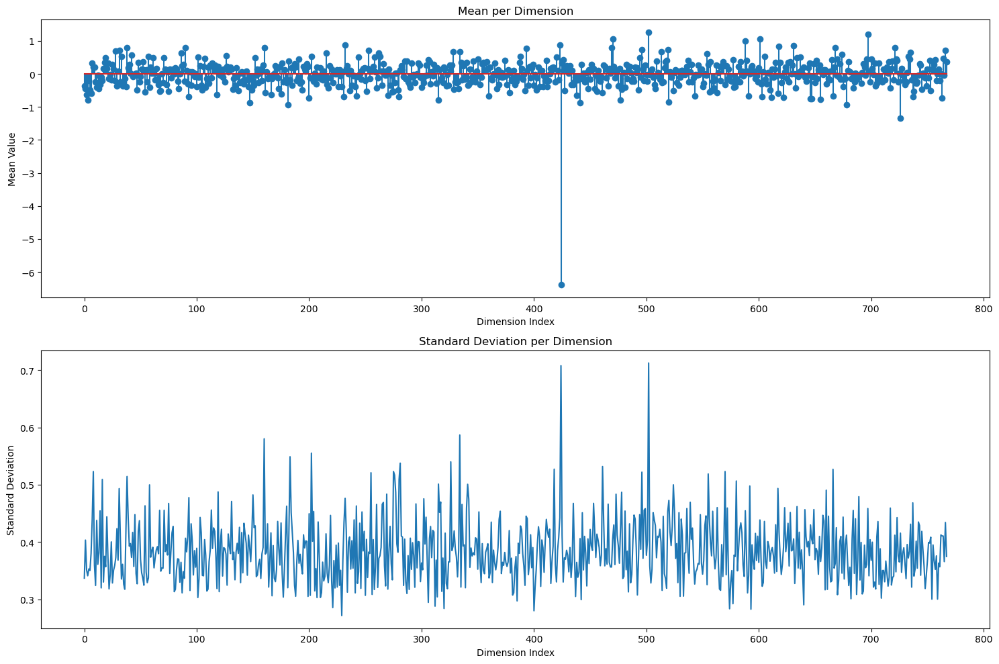

In [15]:
return_sample_size = 5
# Calculate mean and standard deviation for each dimension
mean_per_dimension = np.mean(embeddings, axis=0)
std_per_dimension = np.std(embeddings, axis=0)

# Plot the mean and std for each dimension
plt.figure(figsize=(15, 10))

# Plot mean
plt.subplot(2, 1, 1)
plt.stem(mean_per_dimension)
plt.title("Mean per Dimension")
plt.xlabel("Dimension Index")
plt.ylabel("Mean Value")

largest_mean_idx = np.argpartition(np.array(list(map(abs, mean_per_dimension))), -return_sample_size)[-return_sample_size:]
print("Furthest means (Idx, Val): ", list(zip(largest_mean_idx, mean_per_dimension[largest_mean_idx])))

# Plot standard deviation
plt.subplot(2, 1, 2)
plt.plot(std_per_dimension)
plt.title("Standard Deviation per Dimension")
plt.xlabel("Dimension Index")
plt.ylabel("Standard Deviation")

lowest_std_idx = np.argpartition(std_per_dimension, return_sample_size)[:return_sample_size]
highest_std_idx = np.argpartition(std_per_dimension, -return_sample_size)[-return_sample_size:]
print("Lowest Std (Idx, Val): ", list(zip(lowest_std_idx, std_per_dimension[lowest_std_idx])))
print("Highest Std (Idx, Val): ", list(zip(highest_std_idx, std_per_dimension[highest_std_idx])))

plt.tight_layout()

plt.savefig(f'Plots/MeanStd/{model_name}.png')
plt.show()

### Boxplots

[]

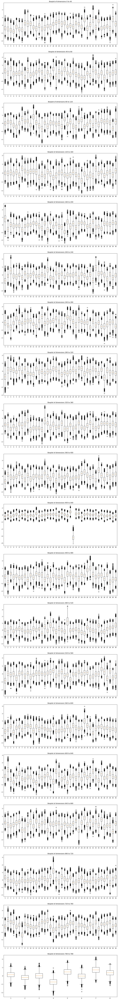

In [16]:
# Boxplot for all dimensions.
# Split into 80 dimensions each plot
dims_per_plot = 40

plot_amounts = embeddings.shape[1]//dims_per_plot + 1
plt.figure(figsize=(16, 7* plot_amounts))

for i in range(plot_amounts):
    plt.subplot(plot_amounts, 1, i+1)
    data = [e[i*dims_per_plot:min((i+1)*dims_per_plot,embeddings.shape[1])] for e in embeddings]
    bplot = plt.boxplot(np.array(data))
    plt.title(f"Boxplot of dimensions {i*dims_per_plot} to {min((i+1)*dims_per_plot,embeddings.shape[1])}")
plt.plot()

### Histogram of some dimensions

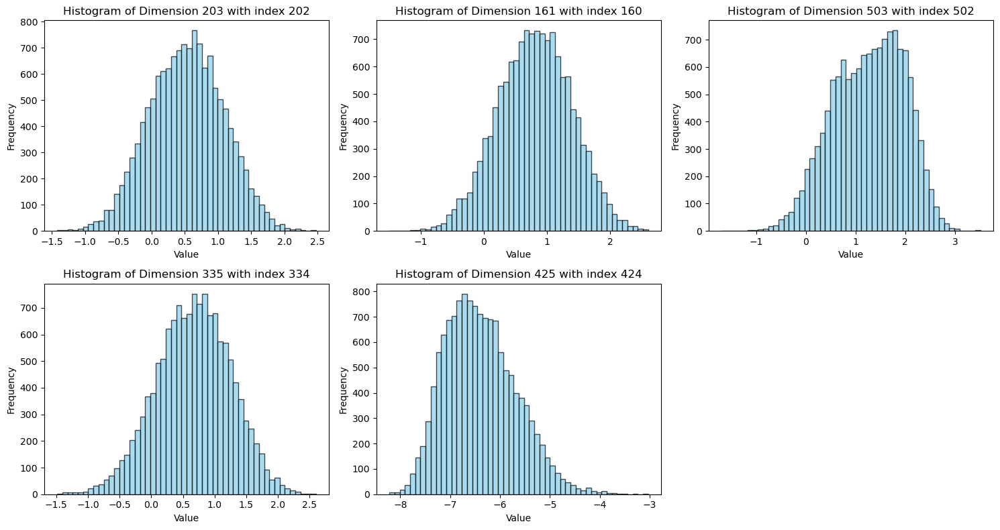

In [17]:
# highest_std_idx
# largest_mean_idx
dimensions = highest_std_idx

plt.figure(figsize=(15, 4*(len(dimensions)//3 + 1)))

for iter, idx in enumerate(dimensions):
    plt.subplot(2, 3, iter + 1)
    plt.hist(embeddings[:, idx], bins=50, color='skyblue', edgecolor='black', alpha=0.7)
    plt.title(f"Histogram of Dimension {idx + 1} with index {idx}")
    plt.xlabel("Value")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

In [18]:
dim_idx = 1
print(embeddings.shape)
type_label = np.tile([0, 1], embeddings.shape[0]//2)

label = [0 if x[dim_idx] < mean_per_dimension[dim_idx] else 1 for x in embeddings]
print(label[:50])
print(f"{sum(type_label == label)/embeddings.shape[0]:.3f}%")

(13592, 768)
[0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0]
0.535%


### Correlation Matrix

Broken still

Highest correlations (Coordinates, Val):
 [((232, 281), 0.4776110865327256), ((281, 232), 0.4776110865327256), ((461, 767), 0.4826414434190448), ((767, 461), 0.4826414434190448), ((208, 107), -0.5034657616236088), ((107, 208), -0.5034657616236088), ((563, 61), -0.5038246782135105), ((424, 502), -0.6424839046961672), ((336, 150), -0.5434813784199208), ((150, 336), -0.543481378419921), ((61, 563), -0.5038246782135105), ((502, 424), -0.6424839046961672)]
Average/Mean correlation (diagnole Zeroed):  0.09717593979603446


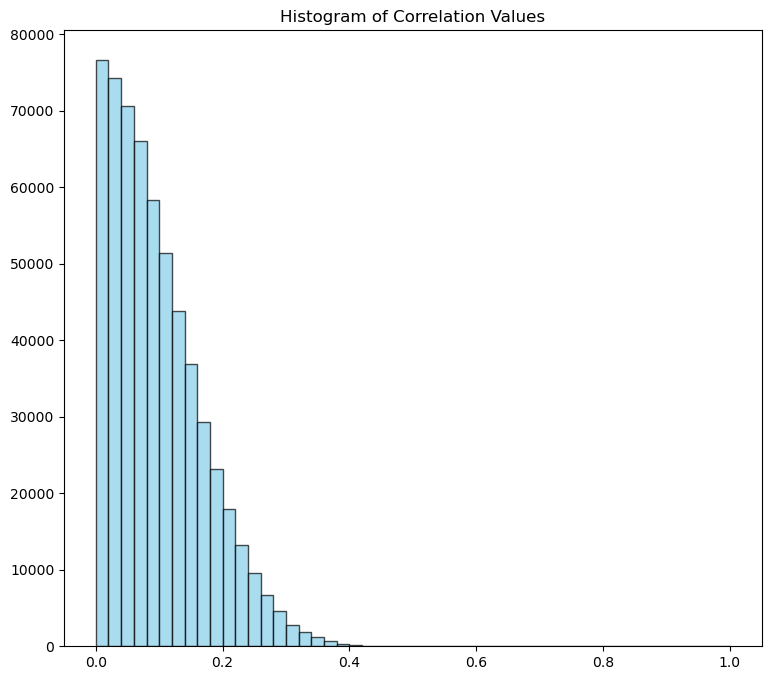

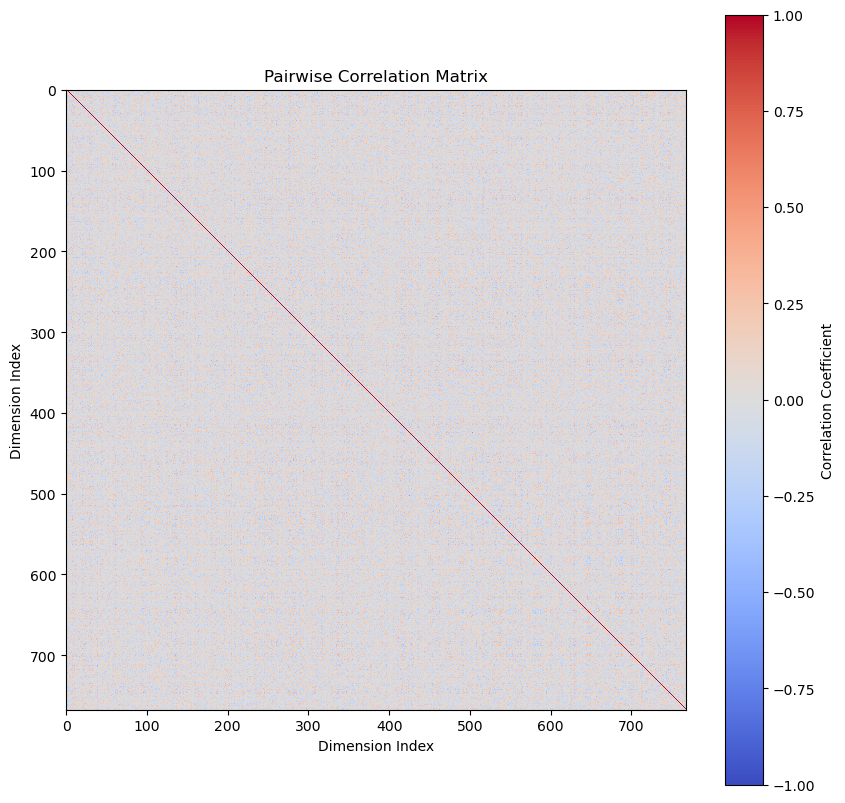

In [19]:
return_sample_size = 12
# Calculate the correlation matrix (pairwise correlation between dimensions)
correlation_matrix = np.corrcoef(embeddings.T)
corr_cp = np.copy(correlation_matrix)
np.fill_diagonal(corr_cp, 0)
highest_corr_idx = np.argpartition(np.array(list(map(abs, corr_cp.flatten()))), -(return_sample_size))
highest_corr_idx = highest_corr_idx[-(return_sample_size):]
highest_corr_coords = list(zip(highest_corr_idx//corr_cp.shape[0], highest_corr_idx%corr_cp.shape[0]))
highest_corr_val = [corr_cp[i][j] for i,j in highest_corr_coords]
print("Highest correlations (Coordinates, Val):\n", list(zip(highest_corr_coords, highest_corr_val)))

# Calculate Average Correlation absolute value (should be low)
avg_corr = np.mean(np.array(list(map(abs, corr_cp))))
print("Average/Mean correlation (diagnole Zeroed): ", avg_corr)

# Histogram of correlation values
plt.figure(figsize=(9, 8))
plt.hist(np.array(list(map(abs, corr_cp.flatten()))), range = [0,1], bins=50, color='skyblue', edgecolor='black', alpha=0.7)
plt.title("Histogram of Correlation Values")

plt.savefig(f'Plots/CorrelationHist/{model_name}.png')
plt.show()

# Plot the correlation matrix using heatmap
plt.figure(figsize=(10, 10))
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='none', vmin=-1, vmax=1)
plt.colorbar(label="Correlation Coefficient")
plt.title("Pairwise Correlation Matrix")
plt.xlabel("Dimension Index")
plt.ylabel("Dimension Index")

plt.savefig(f'Plots/CorrelationMatrix/{model_name}.png')
plt.show()

/home/abecker/.conda/envs/BachelorEnv/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/home/abecker/.conda/envs/BachelorEnv/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



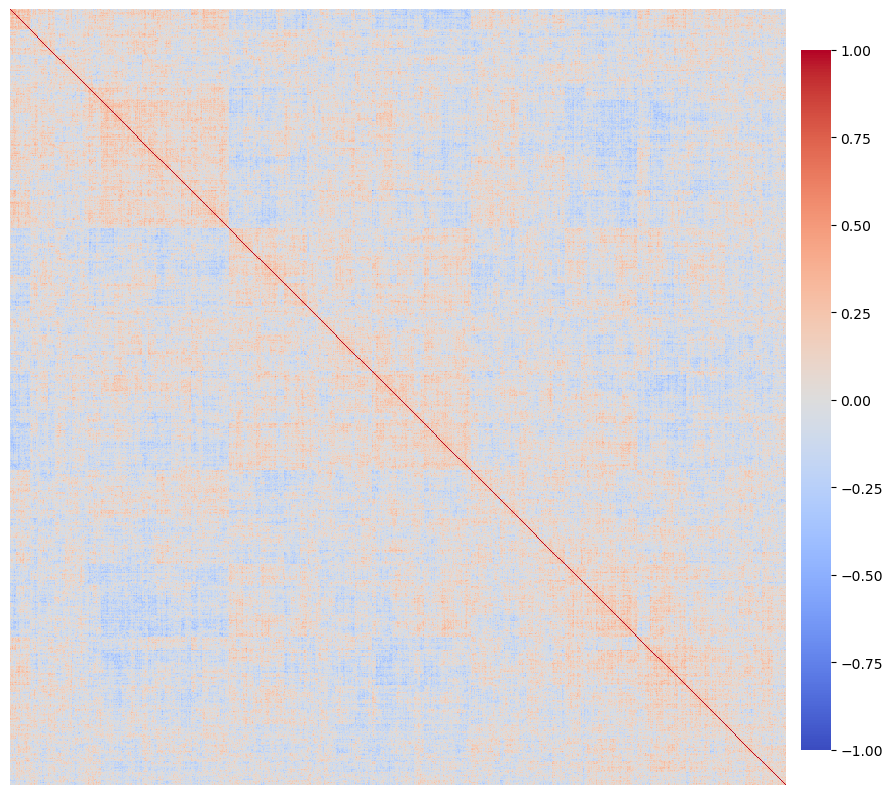

In [20]:
import seaborn as sns

cm = sns.clustermap(correlation_matrix, 
                    cmap="coolwarm", 
                    vmin=-1, vmax=1, 
                    annot=False, 
                    linewidths=0, 
                    figsize=(10, 10), 
                    cbar_pos=(1, 0.05, 0.03, 0.7),  
                    cbar_kws={"shrink": 1, "aspect": 50}, 
                    xticklabels=False, yticklabels=False)
cm.ax_row_dendrogram.set_visible(False)
cm.ax_col_dendrogram.set_visible(False)
plt.savefig(f'Plots/ClusteredCorrelationMatrix/{model_name}.png', bbox_inches="tight")
plt.show()